# Proyecto Final Aprendizaje de máquina
# Claisificación de jugadores de la Fifa
## Acosta Imandt Daniel

Estamos interesados en predecir cual es la posición en la que juegan los disitnitos jugadores de Fifa dados sus atributos  como velocidad, salto, disparo,etc. -->

In [1]:
#Importamos las librerías neceesarias para el proyecto
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier


from sklearn.decomposition import PCA



## Limpieza de datos

In [2]:
#Cargamos nuestros datos y solo nos quedamos con las columnas que nos interesan
f22=pd.read_csv('players_22.csv')
f22['player_positions']=f22['player_positions'].str.split(',').str[0]
print('Dimensiones antes de eliminar cosas que no nos interesan',f22.shape)
#Seleccionamos los atributos que nos interesan
atributos = ['long_name',
 'player_positions',
 #'overall',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic',
 'attacking_crossing',
 'attacking_finishing',
 'attacking_heading_accuracy',
 'attacking_short_passing',
 'attacking_volleys',
 'skill_dribbling',
 'skill_curve',
 'skill_fk_accuracy',
 'skill_long_passing',
 'skill_ball_control',
 'movement_acceleration',
 'movement_sprint_speed',
 'movement_agility',
 'movement_reactions',
 'movement_balance',
 'power_shot_power',
 'power_jumping',
 'power_stamina',
 'power_strength',
 'power_long_shots',
 'mentality_aggression',
 'mentality_interceptions',
 'mentality_positioning',
 'mentality_vision',
 'mentality_penalties',
 'mentality_composure',
 'defending_standing_tackle',
 'defending_sliding_tackle',
 'value_eur']
jugadores = f22[atributos]
f22 = f22[atributos]
print('Dimensiones finales',f22.shape)
f22.head()

Dimensiones antes de eliminar cosas que no nos interesan (19239, 110)
Dimensiones finales (19239, 37)


C:\Users\danie\AppData\Local\Temp\ipykernel_39404\2019398163.py:2: DtypeWarning: Columns (25,108) have mixed types. Specify dtype option on import or set low_memory=False.
  f22=pd.read_csv('players_22.csv')


,long_name,player_positions,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,...,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_standing_tackle,defending_sliding_tackle,value_eur
0,Lionel Andrés Messi Cuccittini,RW,85.0,92.0,91.0,95.0,34.0,65.0,85,95,...,94,44,40,93,95,75,96,35,24,78000000.0
1,Robert Lewandowski,ST,78.0,92.0,79.0,86.0,44.0,82.0,71,95,...,87,81,49,95,81,90,88,42,19,119500000.0
2,Cristiano Ronaldo dos Santos Aveiro,ST,87.0,94.0,80.0,88.0,34.0,75.0,87,95,...,93,63,29,95,76,88,95,32,24,45000000.0
3,Neymar da Silva Santos Júnior,LW,91.0,83.0,86.0,94.0,37.0,63.0,85,83,...,81,63,37,86,90,93,93,32,29,129000000.0
4,Kevin De Bruyne,CM,76.0,86.0,93.0,88.0,64.0,78.0,94,82,...,91,76,66,88,94,83,89,65,53,125500000.0


In [3]:
#limpiamos más datos
#Eliminamos a los porteros y a los sustitutos
jugadores = jugadores.loc[(jugadores["player_positions"] != 'GK') & (jugadores["player_positions"] != 'SUB') & (jugadores["player_positions"] != 'RES')]
jugadores = jugadores.dropna()
#Ponemos las variables independientes y la dependiente
X_jugadores = jugadores.iloc[:,2:-1].values
y_jugadores = jugadores.iloc[:,1].values

In [4]:
#Realizamos los clusters de acuerdo a las posiciones
#Es decir solo nos quedamos con cuatro posiciones diferentes
for j,v in enumerate(y_jugadores):
    if v == 'RF' or v == 'RM' or v == 'LF' or v == 'LM' or v == 'RW' or v == 'LW' or v == 'CAM' or v == 'LAM' or v == 'RAM' or v == 'ST' or v == 'LS' or v == 'RS' or v == 'CF':
        y_jugadores[j] = 'Attacker'
        jugadores[j] = 'Attacker'

    elif v == 'RCM' or v=='LCM' or v == 'CDM' or v == 'LDM' or v == 'RDM' or v == 'CM':
        y_jugadores[j] = 'Midfielder'
        jugadores[j] = 'Midfielder'

    elif v == 'LWB' or v == 'RWB' or v == 'LB' or v == 'RB':
        y_jugadores[j] = 'Lateral Defender'
        jugadores[j] = 'Lateral Defender'
        

    elif v == 'RBC' or v == 'LCB' or v == 'CB':
        y_jugadores[j] = 'Central Defender'
        jugadores[j] = 'Central Defender'

C:\Users\danie\AppData\Local\Temp\ipykernel_39404\804692388.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  jugadores[j] = 'Central Defender'
C:\Users\danie\AppData\Local\Temp\ipykernel_39404\804692388.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  jugadores[j] = 'Central Defender'
C:\Users\danie\AppData\Local\Temp\ipykernel_39404\804692388.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all colum

In [5]:
X_jugadores

array([[85., 92., 91., ..., 96., 35., 24.],
       [78., 92., 79., ..., 88., 42., 19.],
       [87., 94., 80., ..., 95., 32., 24.],
       ...,
       [60., 37., 45., ..., 36., 44., 48.],
       [68., 46., 36., ..., 47., 14., 11.],
       [68., 38., 45., ..., 36., 31., 37.]])

In [6]:
y_jugadores

array(['Attacker', 'Attacker', 'Attacker', ..., 'Midfielder', 'Attacker',
       'Attacker'], dtype=object)

In [7]:
jugadores['player_positions'].value_counts()

Attacker            6848
Midfielder          3827
Central Defender    3321
Lateral Defender    3045
Name: player_positions, dtype: int64

## Exploración de los datos

In [8]:
#Funciones Auxiliares
def cross_grafica(df,variable,variable_tgt):
  v_variables_new_by_loan_status = pd.crosstab(df[variable],df[variable_tgt])
  v_variables_new_by_loan_status_index = list(v_variables_new_by_loan_status.index)
  #valores
  malos = list(v_variables_new_by_loan_status.iloc[:,0])  
  buenos = list(v_variables_new_by_loan_status.iloc[:,1])
  malos2 = list(v_variables_new_by_loan_status.iloc[:,2])  
  buenos2 = list(v_variables_new_by_loan_status.iloc[:,3])
  

#Configuraciones de la grafica
  plt.figure(figsize=(20,9))
## Se crean las primeras barras
  plt.bar(v_variables_new_by_loan_status_index, malos, label='Attacker', color = "darkorange")
  
## Se crean las segundas barras y se apilan sobre las primeras
  plt.bar(v_variables_new_by_loan_status_index, buenos, label='Central Defender',  bottom=malos,color='limegreen')
  plt.bar(v_variables_new_by_loan_status_index, malos2, label='Lateral Defender',  bottom=malos,color='red')
  plt.bar(v_variables_new_by_loan_status_index, buenos2, label='Midfielder',  bottom=malos,color='blue')
  plt.xticks(v_variables_new_by_loan_status_index, v_variables_new_by_loan_status_index) #indice y grupos en este caso es lo mismo (indice el numero de grupos y grupos las etiquetas)
  plt.ylabel("Frecuency")
  plt.xlabel(variable)
  plt.title(variable + '_' + variable_tgt)
  plt.legend()
  # plt.savefig(v_variables_new[i]+".png")
  plt.show()

In [9]:
#Escogemos a los atributos que queremos graficar
atributos2 = [
 'player_positions',
 #'overall',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic',
 'attacking_crossing',
 'attacking_finishing',
 'attacking_heading_accuracy',
 'attacking_short_passing',
 'attacking_volleys',
 'skill_dribbling',
 'skill_curve',
 'skill_fk_accuracy',
 'skill_long_passing',
 'skill_ball_control',
 'movement_acceleration',
 'movement_sprint_speed',
 'movement_agility',
 'movement_reactions',
 'movement_balance',
 'power_shot_power',
 'power_jumping',
 'power_stamina',
 'power_strength',
 'power_long_shots',
 'mentality_aggression',
 'mentality_interceptions',
 'mentality_positioning',
 'mentality_vision',
 'mentality_penalties',
 'mentality_composure',
 'defending_standing_tackle',
 'defending_sliding_tackle']

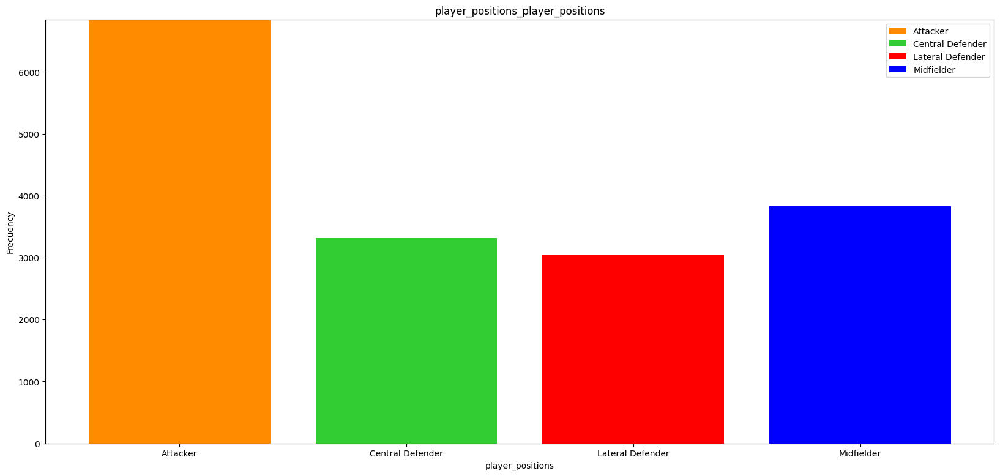

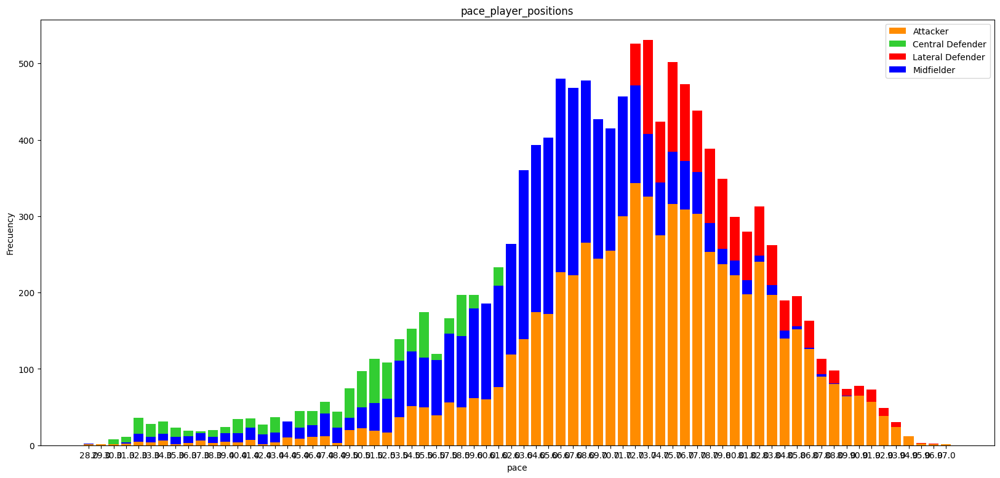

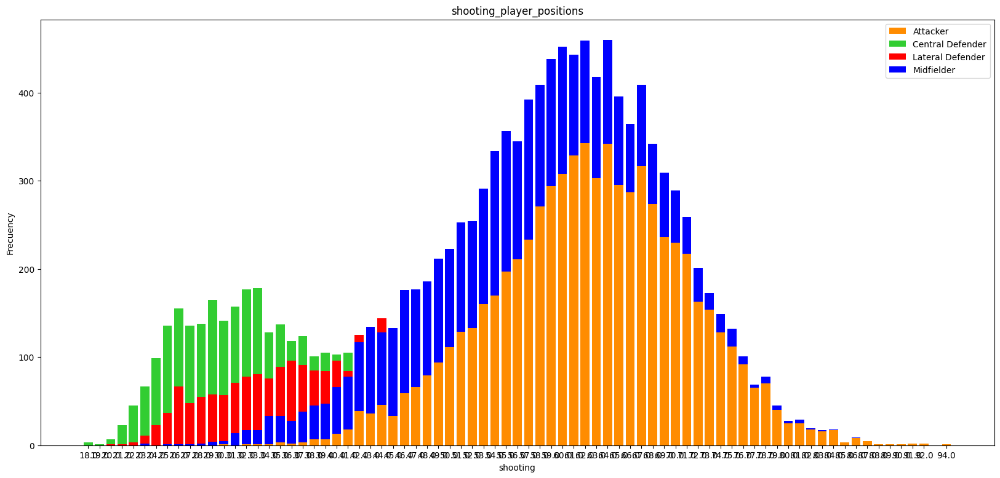

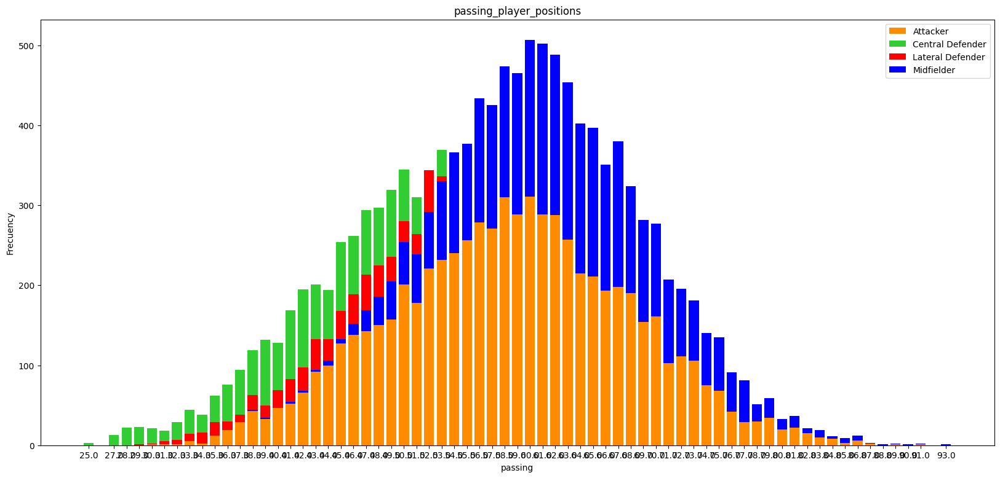

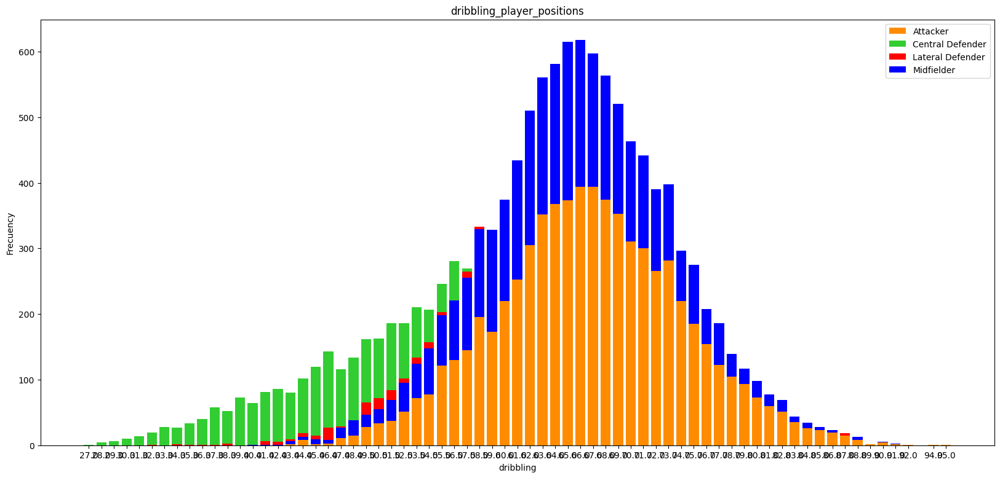

...

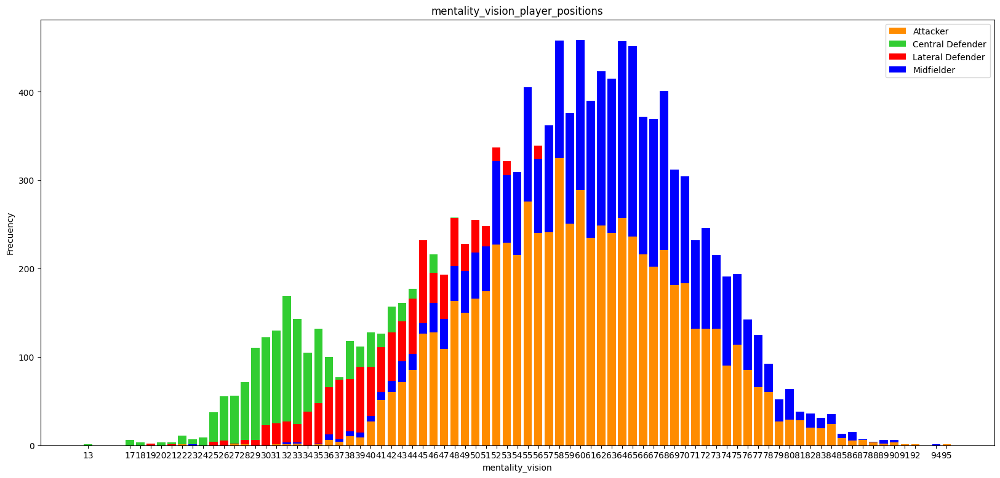

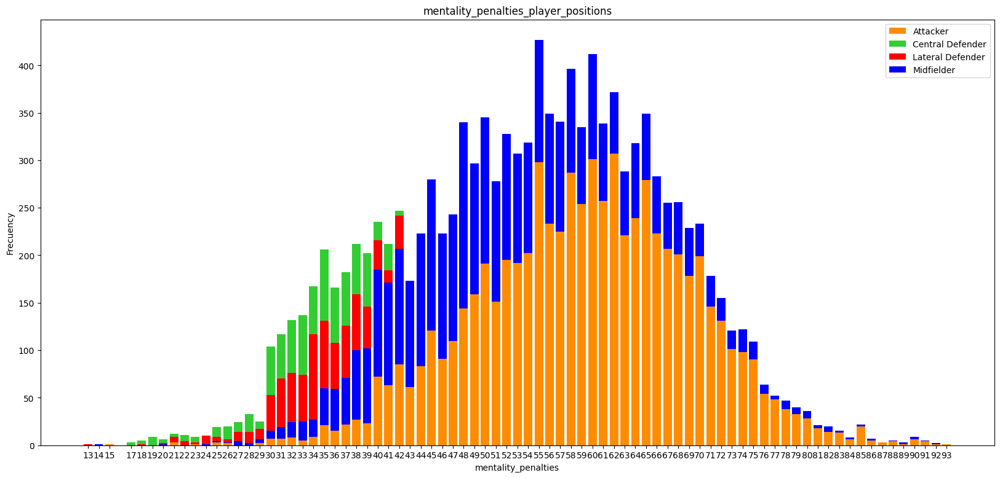

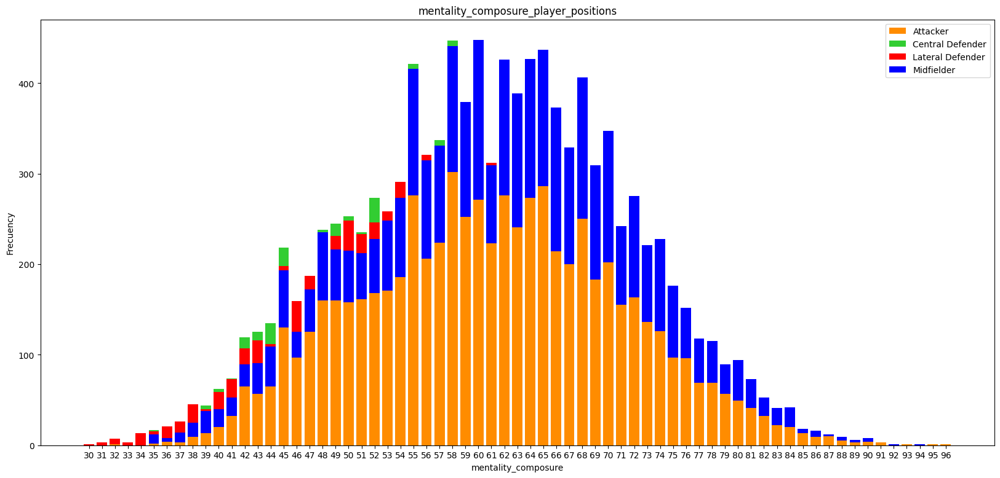

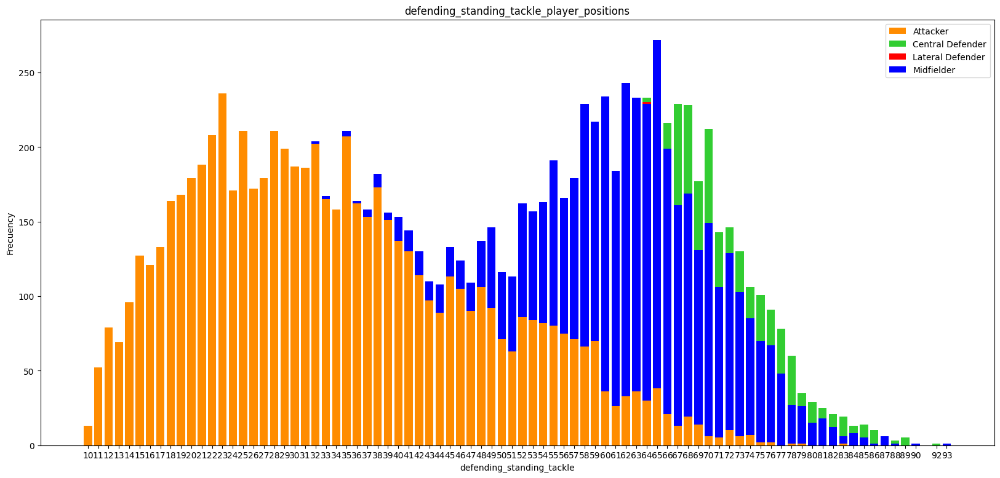

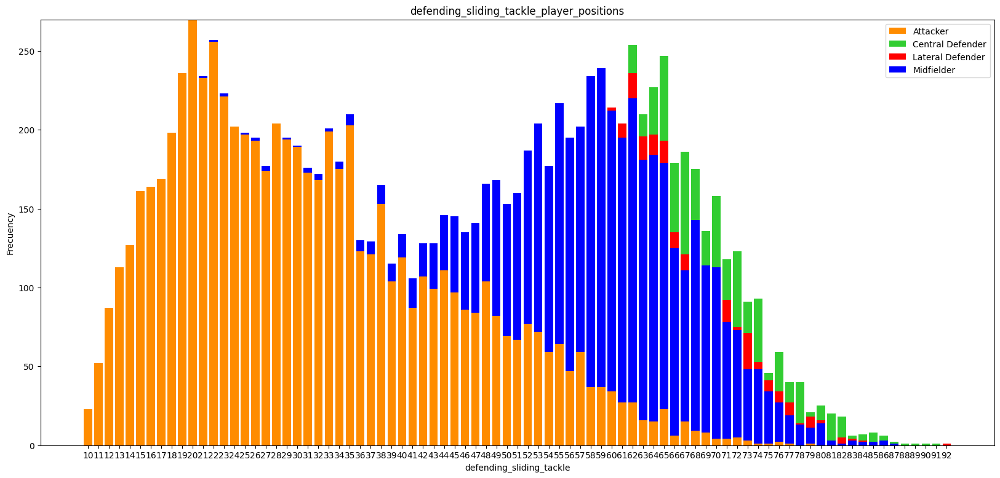

In [10]:
# Graficamos distintos atributos para ver la distribución dependendiendo de su posición
for j in atributos2:
    cross_grafica(jugadores,j,'player_positions')

A  partir de las gráficas anteriores podemos notar que en efecto las distintas posiciones tienen ciertas proporciones en donde se juntan más dependeindo de las habilidades que sd tienen por  jugador

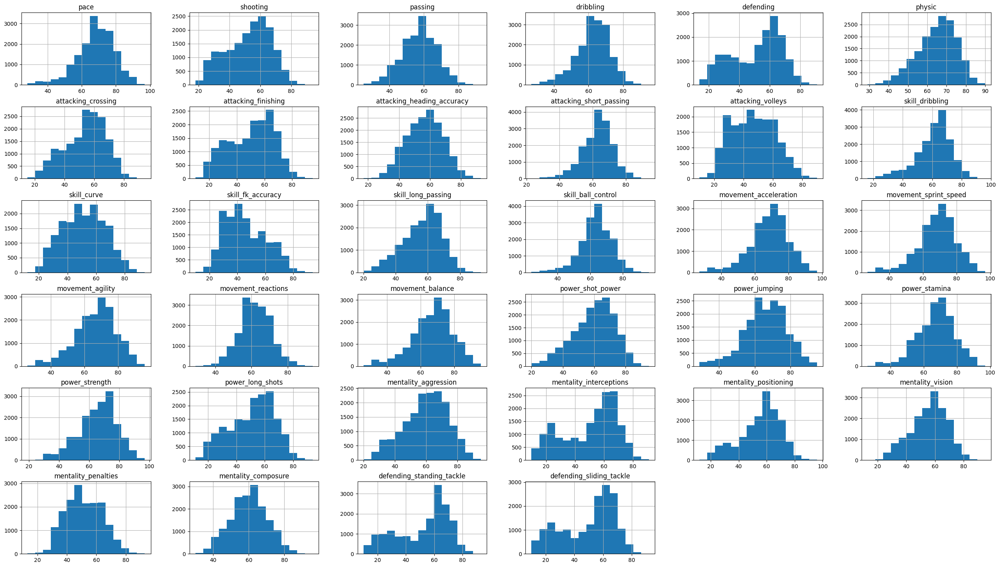

In [11]:
#Vemos las distribuciones para todos los jugadores sin importar posición
jugadores[atributos2].hist(bins=15, figsize=(32, 18), layout=(6, 6))
plt.show()

## Normalización de los datos

In [12]:
jugadores['player_positions'].value_counts()

Attacker            6848
Midfielder          3827
Central Defender    3321
Lateral Defender    3045
Name: player_positions, dtype: int64

In [13]:
#Asignamos variables numéricas a las cotégoricas
jugadores['player_positions'].replace('Attacker',0,inplace=True)
jugadores['player_positions'].replace('Midfielder',1,inplace=True)
jugadores['player_positions'].replace('Central Defender',2,inplace=True)
jugadores['player_positions'].replace('Lateral Defender',3,inplace=True)

In [14]:
jugadores['player_positions'].value_counts()

0    6848
1    3827
2    3321
3    3045
Name: player_positions, dtype: int64

## Outliers

player_positions


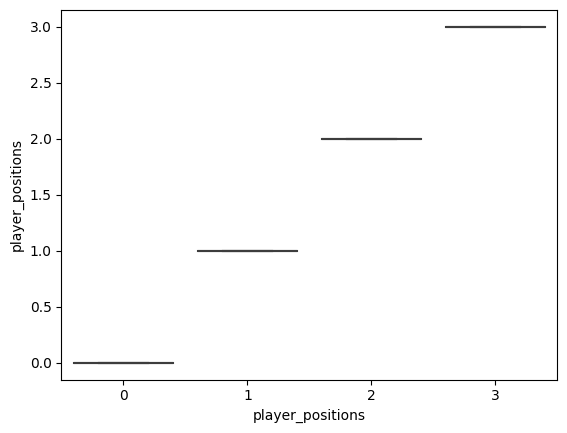

pace


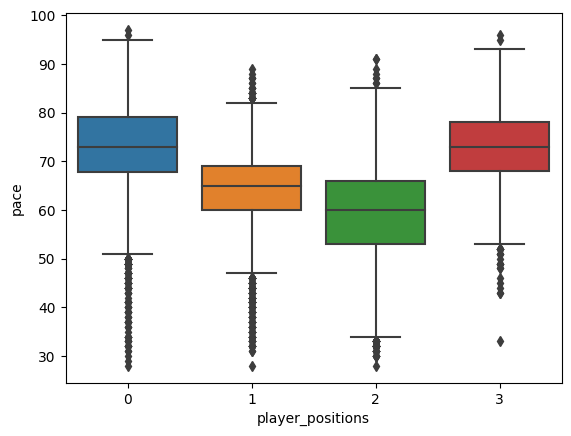

shooting


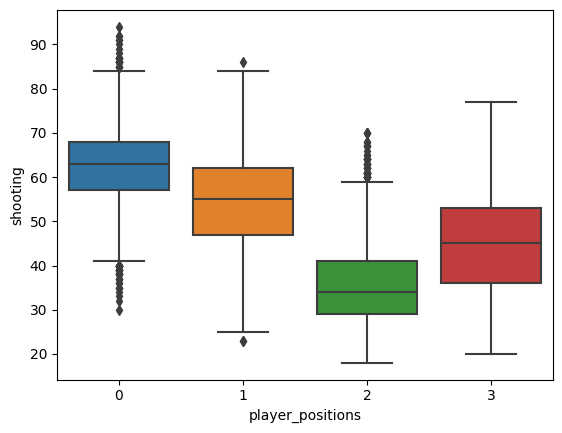

passing


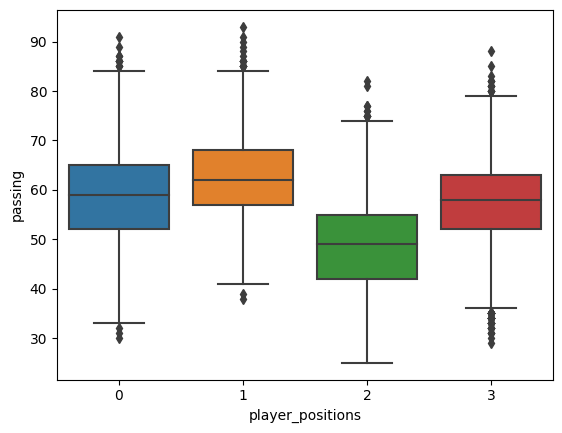

dribbling


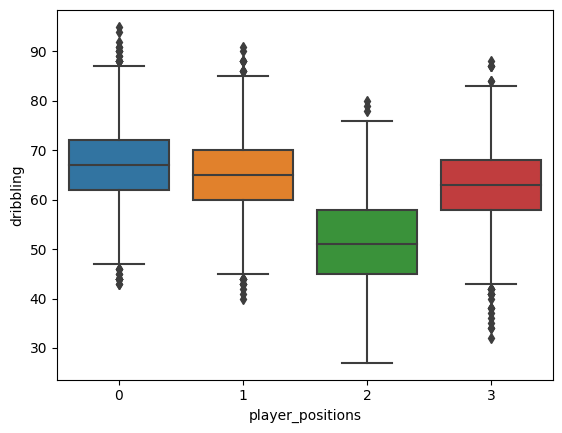

defending


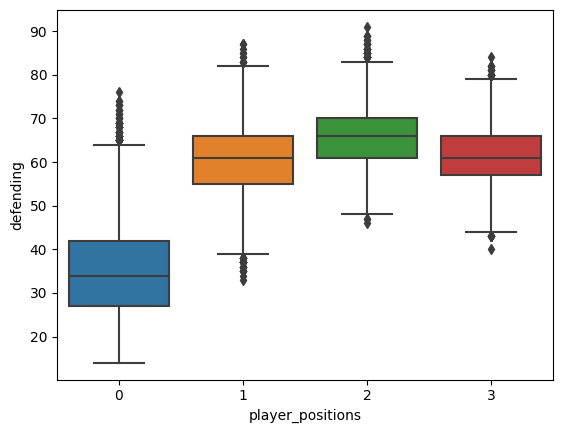

physic


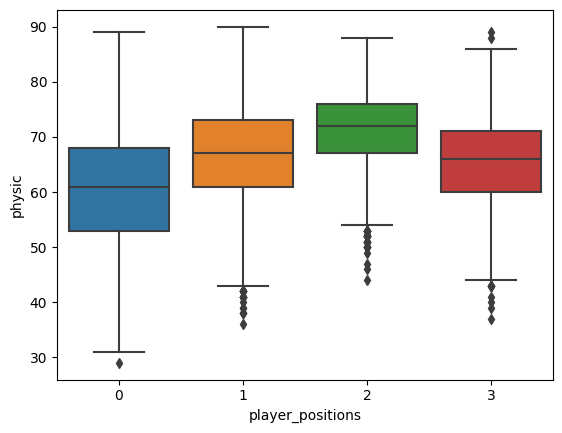

attacking_crossing


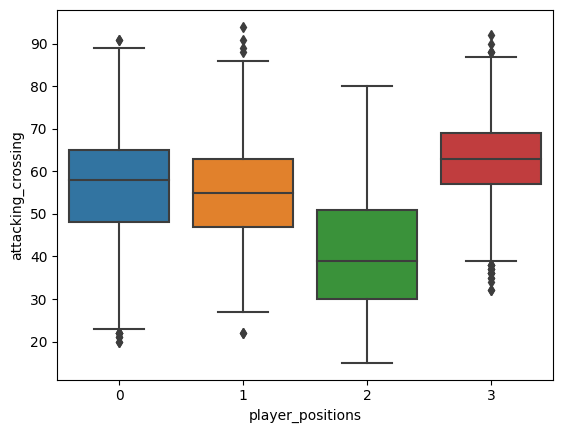

attacking_finishing


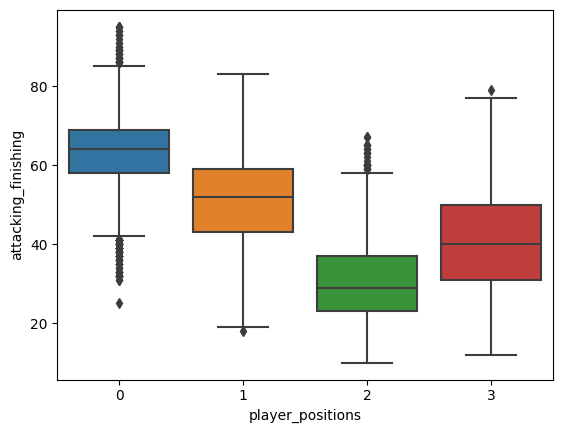

attacking_heading_accuracy


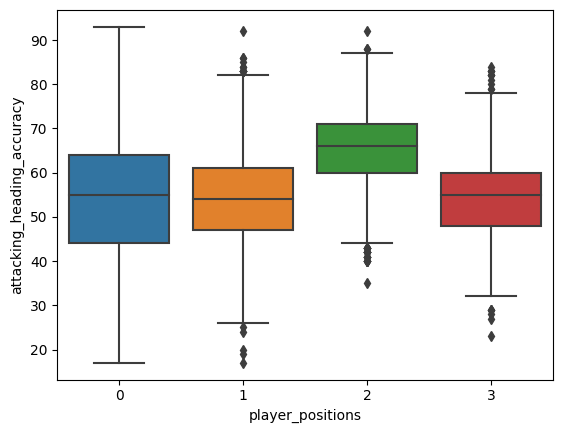

attacking_short_passing


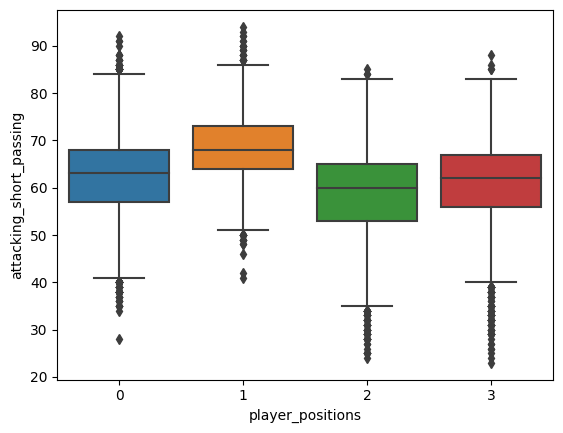

attacking_volleys


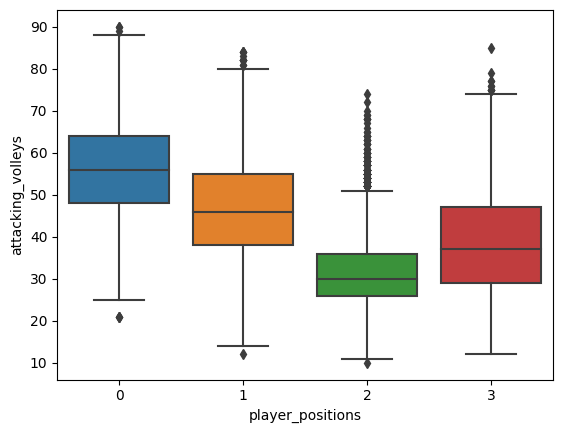

skill_dribbling


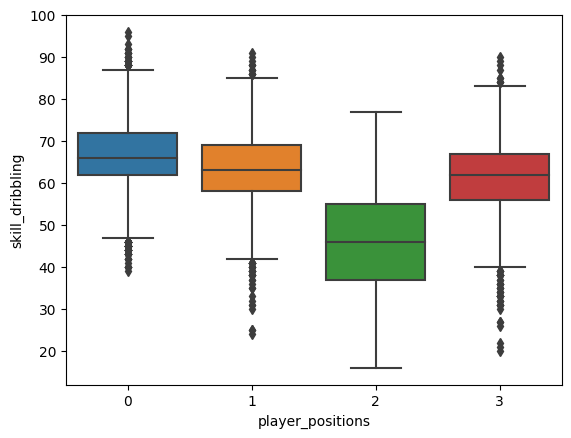

skill_curve


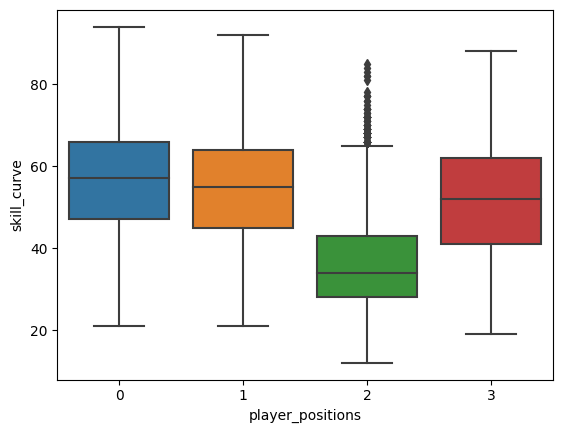

skill_fk_accuracy


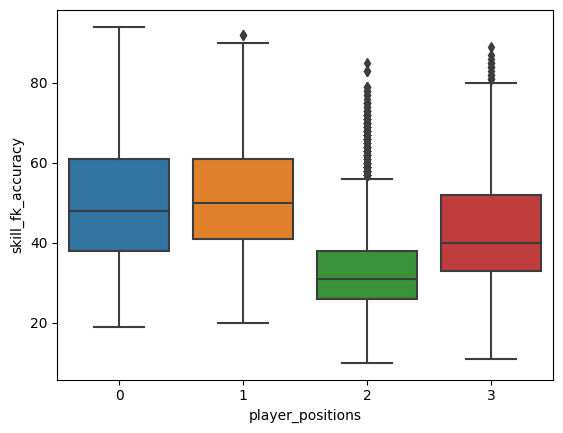

skill_long_passing


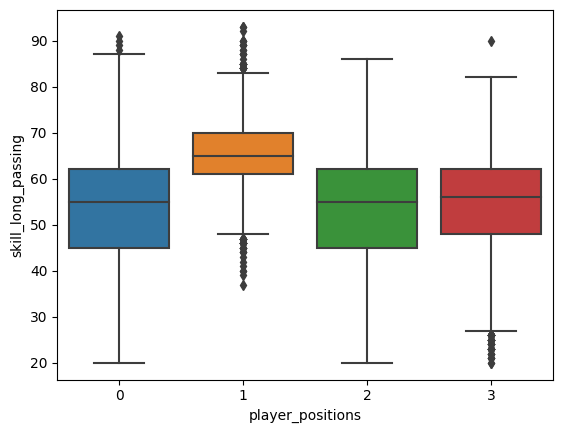

skill_ball_control


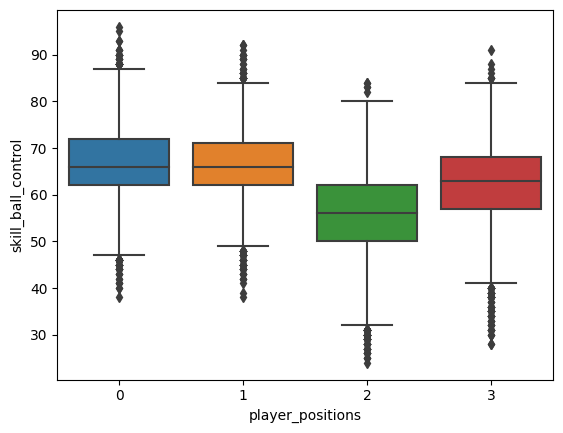

movement_acceleration


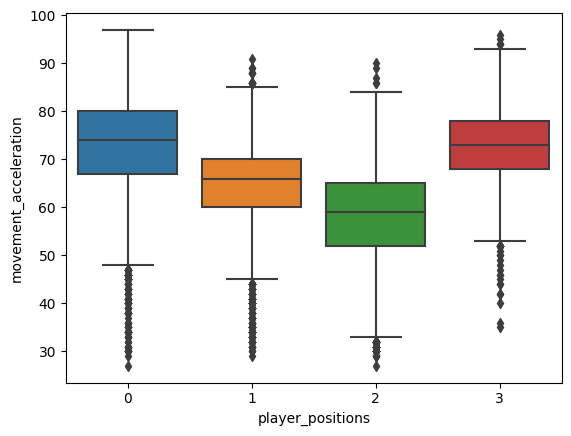

movement_sprint_speed


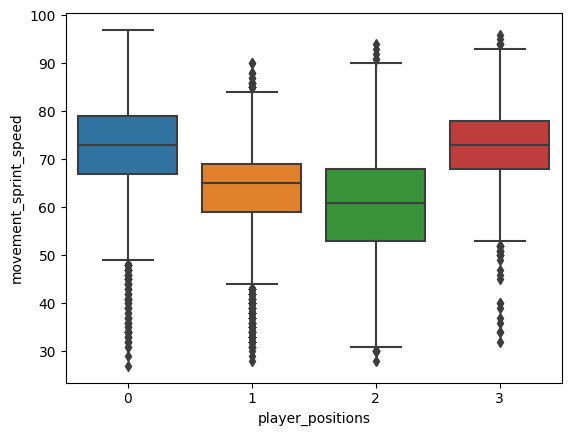

movement_agility


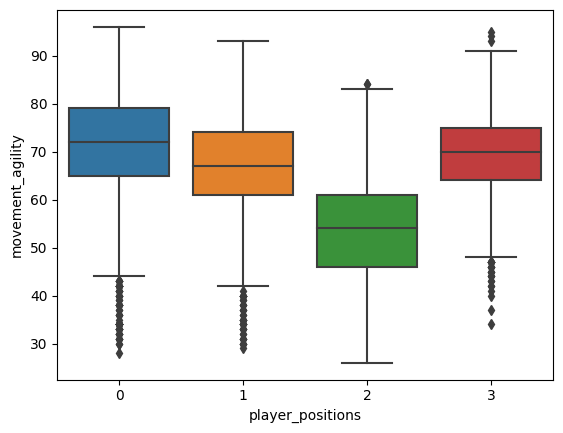

movement_reactions


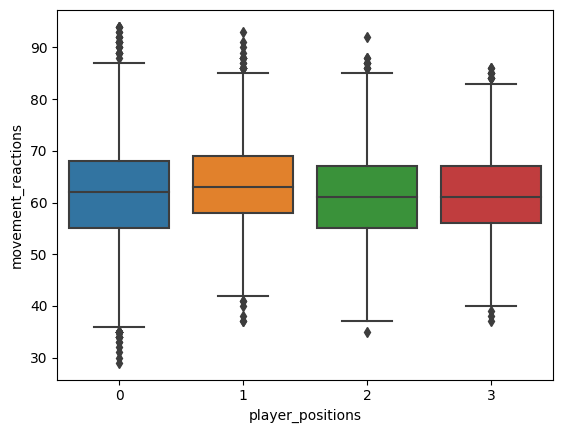

movement_balance


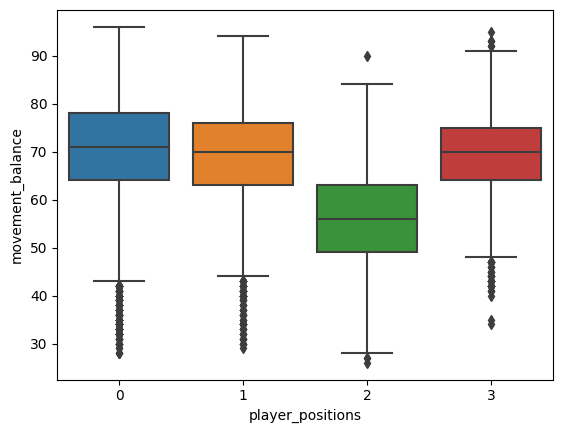

power_shot_power


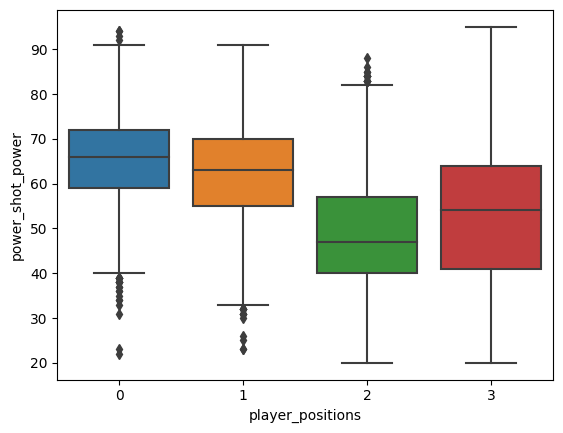

power_jumping


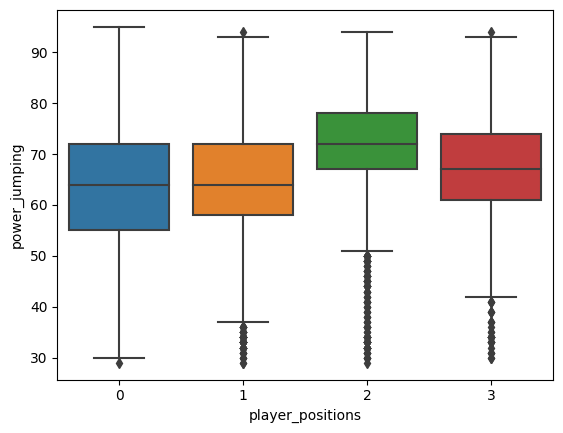

power_stamina


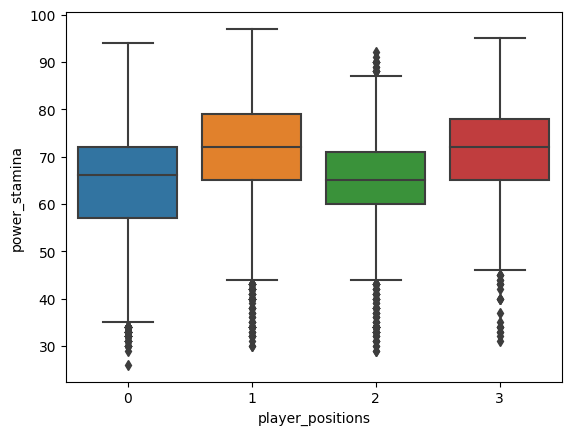

power_strength


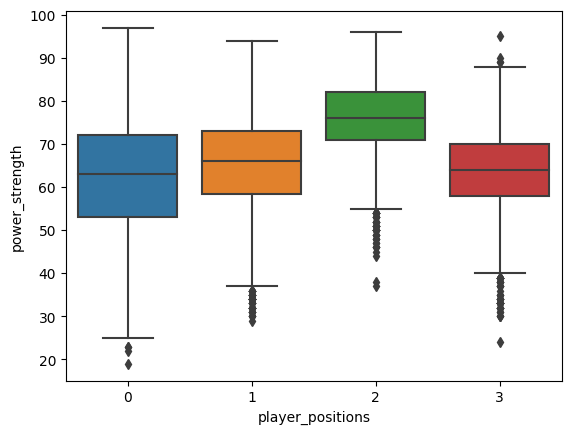

power_long_shots


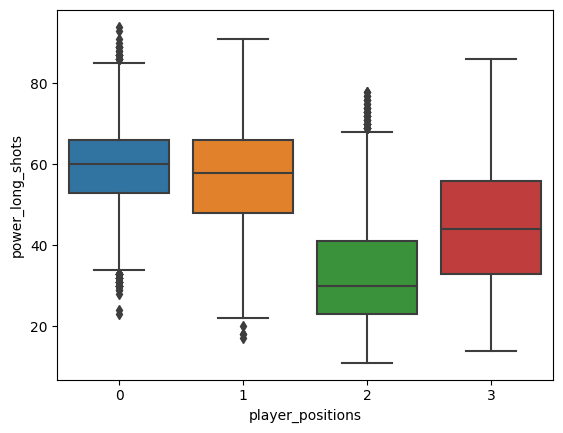

mentality_aggression


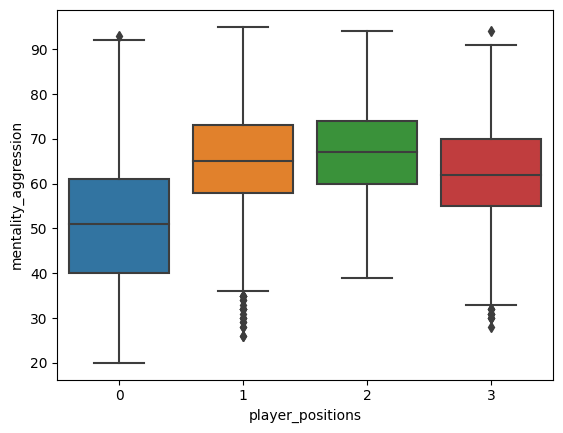

mentality_interceptions


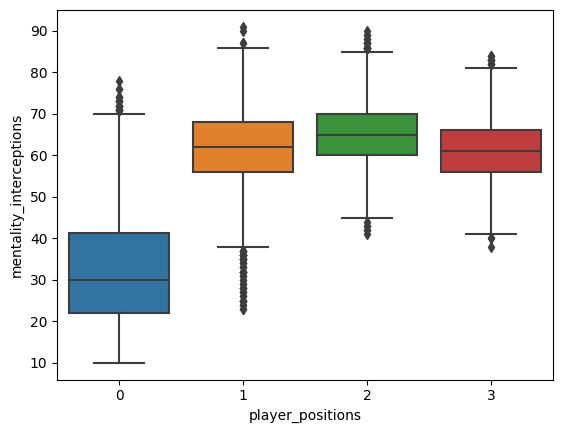

mentality_positioning


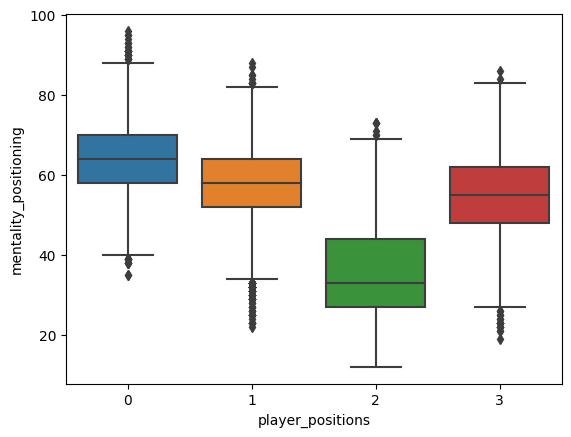

mentality_vision


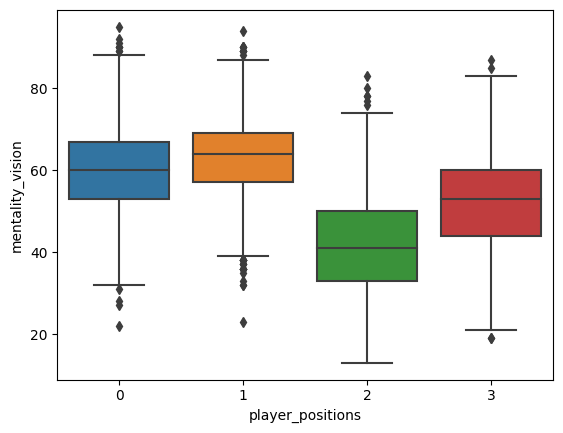

mentality_penalties


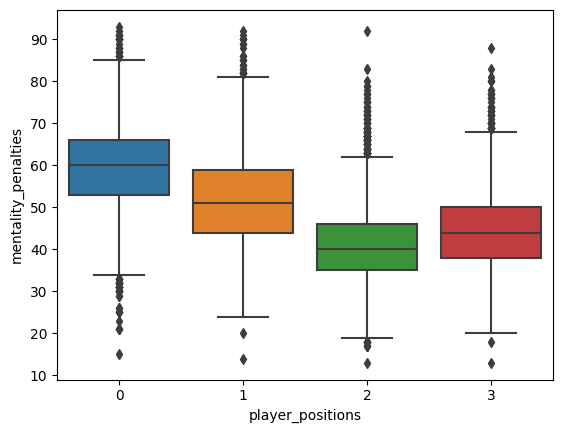

mentality_composure


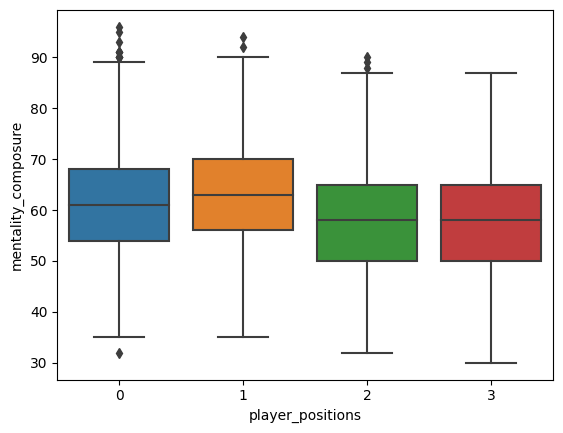

defending_standing_tackle


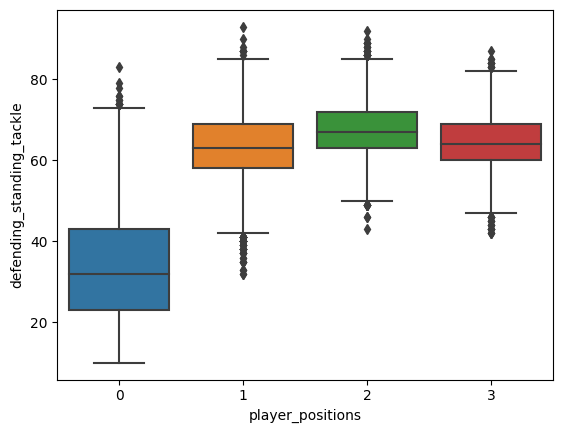

defending_sliding_tackle


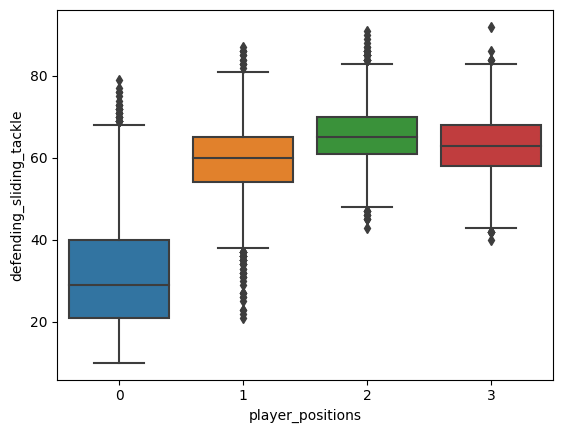

In [15]:
#Vamos a ver los outliers para las distintias posiciones de los jugadores, esto con la ayuda de disgrams de caja
for j in atributos2:
    print(j)
    sns.boxplot(data=jugadores, x = 'player_positions',y=j)
    plt.show()

# Modelos
## PCA Y MODELOS(jugadores) 

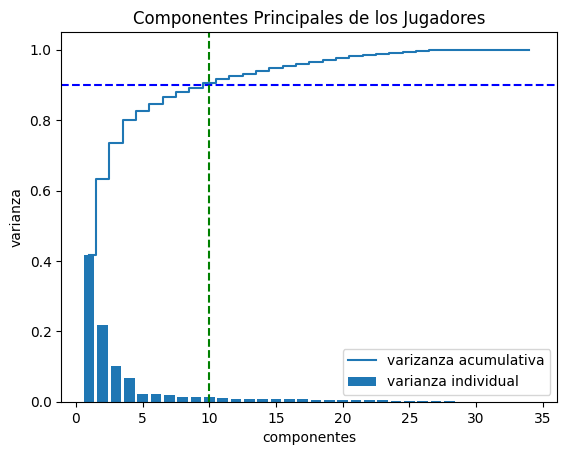

In [16]:
#Graficamos la varianza de las componentes principales para decidir cuantas usar

#Estandarizamos
sc = StandardScaler()
X_jugadores_std = sc.fit_transform(X_jugadores)

#Sacamos Matriz de Covarianza
cov_mat = np.cov(X_jugadores_std.T)

#Sacamos eigenvalores e eigenvectores de la matriz de covarianza
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)
tot = sum(eigen_vals)

#Ordenamos los eigenvalores de acuerdo a su magnitud
var_exp = [ev/tot for ev in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

#Creamos la grafica de la varianza de las componentes principales
plt.bar(range(1,35),var_exp, label="varianza individual",align = "center")
plt.step(range(1,35), cum_var_exp, where="mid", label="varizanza acumulativa")
plt.axhline(y=0.9,color='blue', linestyle='--')
plt.axvline(x=10,color='green', linestyle='--')
plt.xlabel("componentes")
plt.ylabel("varianza")
plt.title("Componentes Principales de los Jugadores")
plt.legend(loc = "best")
plt.show()

Vemos que con 10 componentes principales ya se abarca el $90\% de la varianza ,por lo que solo usaremos estos, en  vez de los 35 iniciales, esto para reducir espacio y tiempo de computo

In [17]:

#Creamos el objeto de las componentes principales e indicamos que queremos 10
pca = PCA(n_components=10)

#Transformamos las caracteristicas de los jugadores
X_jugadores_pca = pca.fit_transform(X_jugadores_std)

#Separamos nuestro conjunto en prueba y entrenamiento
X_train, X_test, y_train, y_test = train_test_split(X_jugadores_pca,y_jugadores,test_size = 0.3,random_state=3)

In [18]:
# test options for classification
num_folds = 10
scoring = 'accuracy'

In [19]:
from sklearn.model_selection import train_test_split, KFold,cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.metrics import classification_report, confusion_matrix


## Comparación de algoritmos

Queremos ver distintos algoritmos para ver cuales generan mejores resutados, los agoritmos que veremos son 
- LogisticRegression
-  LinearDiscriminantAnalysis
- KNeighborsClassifier
- DecisionTreeClassifier
- GaussianNB
- AdaBoostClassifier
- RandomForestClassifier

In [20]:
num_folds = 10
seed = 7

In [21]:
models = []
models.append(('LR', LogisticRegression(n_jobs=-1)))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
#Neural Network
#models.append(('NN', MLPClassifier()))
# Ensemble Models
# Boosting methods
models.append(('AB', AdaBoostClassifier()))
# models.append(('GBM', GradientBoostingClassifier()))
# Bagging methods
models.append(('RF', RandomForestClassifier(n_jobs=-1)))

In [22]:

results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=num_folds)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.904259 (0.010550)
LDA: 0.889169 (0.007458)
KNN: 0.881708 (0.010121)
CART: 0.818664 (0.012941)
NB: 0.865948 (0.010780)
AB: 0.869384 (0.011991)
RF: 0.891350 (0.008939)


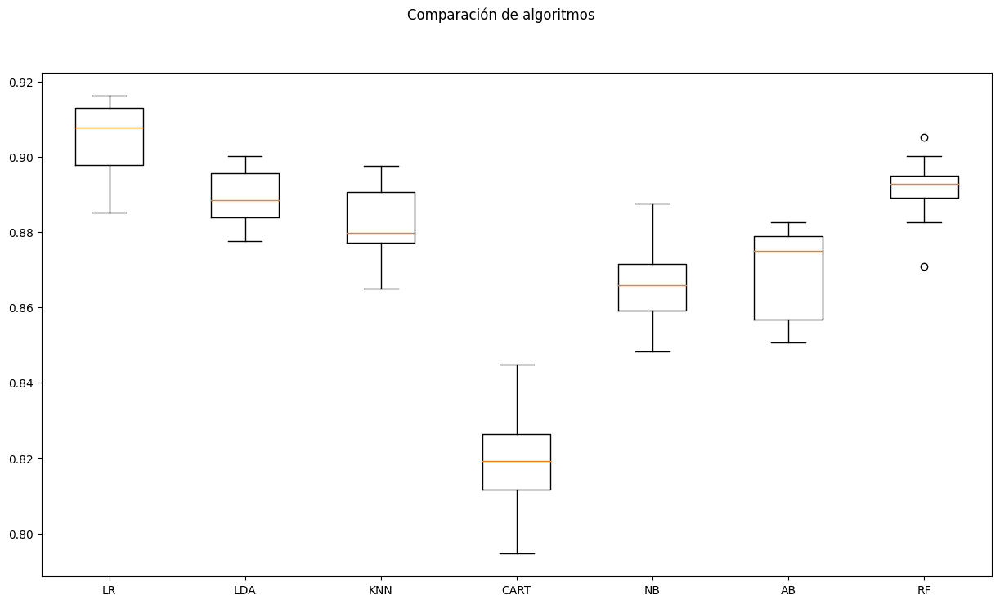

In [23]:
# compare algorithms
fig = plt.figure()
fig.suptitle('Comparación de algoritmos')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
fig.set_size_inches(15,8)
plt.show()


## K vecinos

In [24]:
#Creamos el objeto de los k-vecinos con los parametros
kvecinos = KNeighborsClassifier(n_neighbors=5,metric='minkowski',p=2,weights='distance')

#Entrenamos el modelo
kvecinos.fit(X_train,y_train)

#Realizamos predicciones sobre el conjunto de prueba
y_predict =  kvecinos.predict(X_test)

                  precision    recall  f1-score   support

        Attacker       0.95      0.92      0.93      2042
Central Defender       0.90      0.88      0.89       985
Lateral Defender       0.83      0.83      0.83       937
      Midfielder       0.77      0.83      0.80      1149

        accuracy                           0.87      5113
       macro avg       0.86      0.86      0.86      5113
    weighted avg       0.88      0.87      0.88      5113



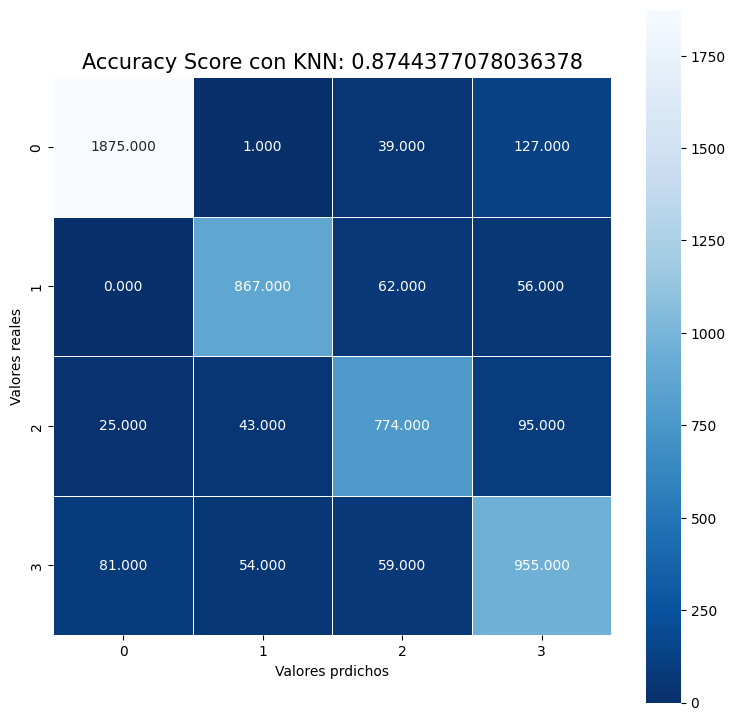

In [25]:
#Mostramos los scores del modelo
matriz = confusion_matrix(y_test,y_predict)
score = kvecinos.score(X_test, y_test)
plt.figure(figsize=(9,9))
sns.heatmap(matriz, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Valores reales');
plt.xlabel('Valores prdichos');
all_sample_title = 'Accuracy Score con KNN: {0}'.format(score)
plt.title(all_sample_title, size = 15);

print((classification_report(y_test, y_predict)))

## Regresión logistica 

                  precision    recall  f1-score   support

        Attacker       0.95      0.94      0.94      2042
Central Defender       0.90      0.89      0.89       985
Lateral Defender       0.85      0.87      0.86       937
      Midfielder       0.84      0.85      0.85      1149

        accuracy                           0.90      5113
       macro avg       0.88      0.89      0.89      5113
    weighted avg       0.90      0.90      0.90      5113



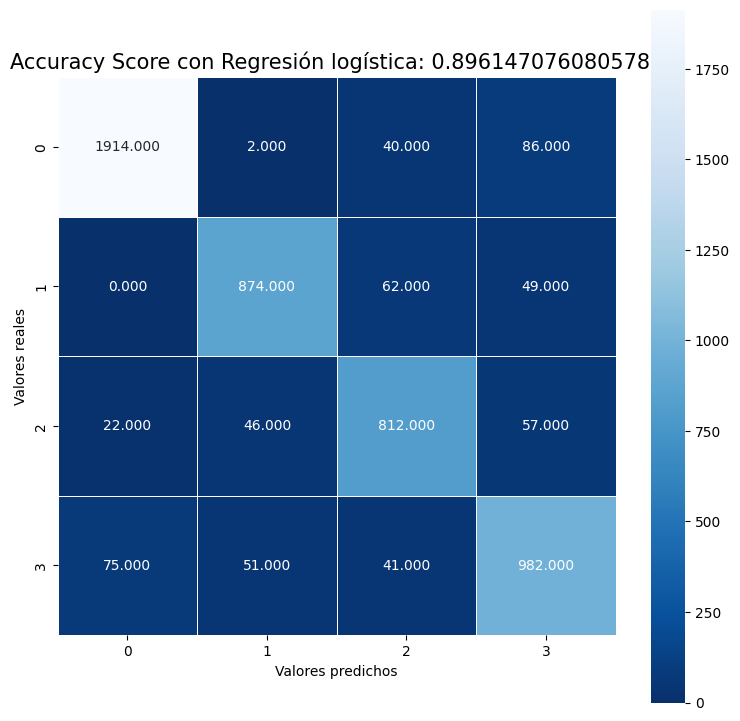

In [26]:
logisticRegr = LogisticRegression()
logisticRegr.fit(X_train, y_train)
logisticRegr.predict(X_test)
score = logisticRegr.score(X_test, y_test)

predictions = logisticRegr.predict(X_test)
cm = metrics.confusion_matrix(y_test, predictions)
plt.figure(figsize=(9,9))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Valores reales');
plt.xlabel('Valores predichos');
all_sample_title = 'Accuracy Score con Regresión logística: {0}'.format(score)
plt.title(all_sample_title, size = 15);
print((classification_report(y_test, predictions)))

## Decision tree classifier

                  precision    recall  f1-score   support

        Attacker       0.90      0.89      0.90      2042
Central Defender       0.82      0.83      0.82       985
Lateral Defender       0.73      0.74      0.73       937
      Midfielder       0.70      0.71      0.71      1149

        accuracy                           0.81      5113
       macro avg       0.79      0.79      0.79      5113
    weighted avg       0.81      0.81      0.81      5113



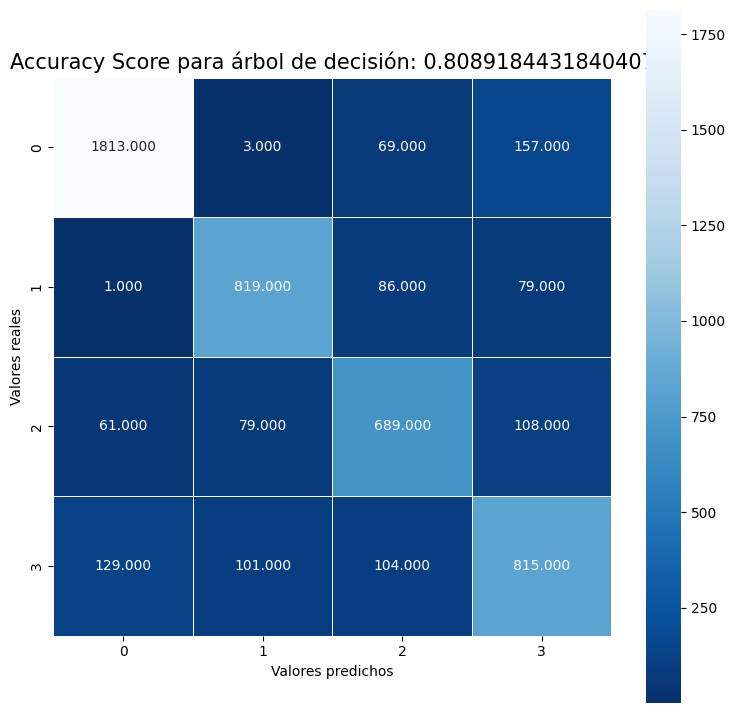

In [27]:

#Creamos el árbol de decisión
clf = DecisionTreeClassifier()

# Lo entrenemos
clf = clf.fit(X_train,y_train)
score = clf.score(X_test, y_test)
#Predecimos para el test set
y_pred = clf.predict(X_test)
cm2 = metrics.confusion_matrix(y_test, y_pred)
plt.figure(figsize=(9,9))
sns.heatmap(cm2, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Valores reales');
plt.xlabel('Valores predichos');
all_sample_title = 'Accuracy Score para árbol de decisión: {0}'.format(score)
plt.title(all_sample_title, size = 15);
print((classification_report(y_test, y_pred)))

## Random Forest

In [28]:
# prepare model
model = RandomForestClassifier(criterion='gini', n_estimators=80,max_depth=10,n_jobs=-1) # rbf is default kernel
#model = LogisticRegression() 
clf2=model.fit(X_train, y_train)
score = clf2.score(X_test, y_test)

                  precision    recall  f1-score   support

        Attacker       0.94      0.91      0.93      2042
Central Defender       0.91      0.88      0.89       985
Lateral Defender       0.84      0.83      0.83       937
      Midfielder       0.79      0.85      0.82      1149

        accuracy                           0.88      5113
       macro avg       0.87      0.87      0.87      5113
    weighted avg       0.88      0.88      0.88      5113



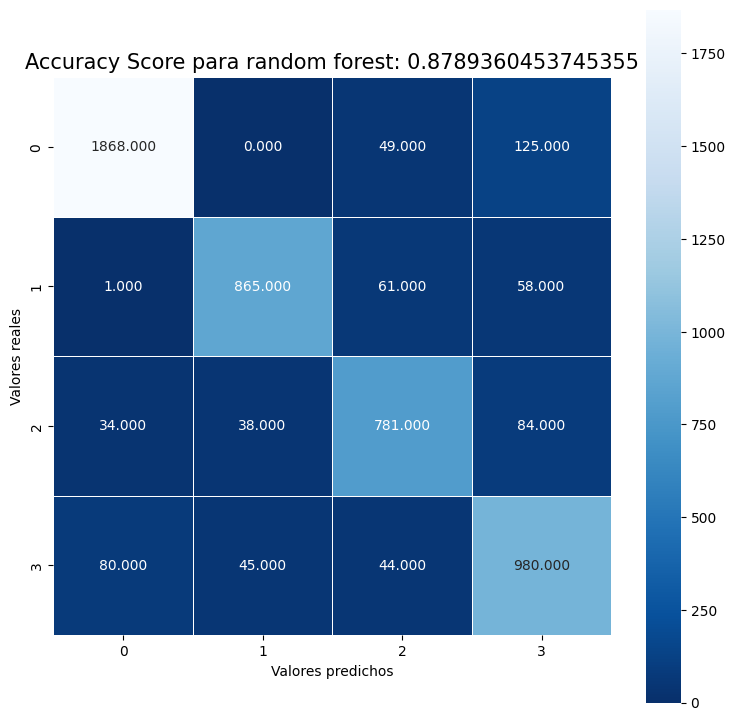

In [29]:
# estimate accuracy on validation set
predictions = model.predict(X_test)
cm3=confusion_matrix(y_test, predictions)
plt.figure(figsize=(9,9))
sns.heatmap(cm3, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Valores reales');
plt.xlabel('Valores predichos');
all_sample_title = 'Accuracy Score para random forest: {0}'.format(score)
plt.title(all_sample_title, size = 15);
print((classification_report(y_test, predictions)))

## Conclusiones
Despues de haber limpiado los datos y ponerlos listos para poder trabajar con ellos, observamos que en efecto hay bastntes atributos que son resqueridos para las posciones en las que se suele jugar, por lo que las habilidades de los jugadores nos pueden servir bastante para saber cual sería la posición idónea para ellos, es por eso que tratamos de predecir sus posiciones con distintos algoritmos que son KNN, Regresión logística, árboles de decisión y random forest, de estas notamos que todos consigueorn buenos resultados, pero el que mejor accuracy obtuvo fue regresión logística con una ccuracy del $89\%$, por lo que son muy buenos resultados e general, considerando que había cuatro distintas categorías.